Pedro Siade Ferreira

202004734

1) Pesquisar e Estudar Filtragem no Domínio da Frequência – O assunto foi tratado na última aula presencial, releia os slides, mas leia sobre os Fundamentos de Filtragem no Domínio da Frequência (Gonzalez, 4.7, pág. 166). Leia o Resumo dos Passos para efetuar a filtragem (Gonzalez, 4.7.3). 

Na verdade, existe uma certa correspondência entre filtragem no domínio do espaço e da frequência e isso ocorre devido ao teorema da convolução (Gonzalez, 4.7.4). Existem inúmeros vídeos sobre o assunto na Internet. Tais vídeos explicam o processo e o segundo fornece códigos em Python:

a) Implemente e explique os filtros passa-baixa ideal (Gonzalez, 4.8.1) e passa-baixa Butterworth com diversas
frequências de corte (Gonzalez, p. 179). Use para filtrar a imagem da Figura 4.45a. Explique o que você observa
nos resultados?
b) Implemente um filtro passa-baixa gaussiano com diversas frequências de corte (Gonzalez, Exemplo 4.18,
imagem da Figura 4.48a). O que você observa nos resultados? Explique a equação desse filtro e a obtenção de
H(u,v) na Tabela 4.4;
c) Implemente um filtro passa-alta ideal com diversos raios (Gonzalez, Figura 4.52a, p. 185; filtrar a imagem da
Figura 4.41a). O que você observa nos resultados?
d) Implemente um filtro de chanfro (notch) para eliminação de padrões de impressão (jornais, fotografias antigas
etc.). Use a imagem da Figura 4.64a;
e) Implemente um filtro rejeita-banda para a imagem do Gonzalez/Figura 5.16 (remoção de ruído periódico). Você
conseguiu obter o mesmo resultado? Você conseguiria melhorá-lo? Mostre.


In [223]:
import numpy as np
import cv2 # importa opencv
from scipy import misc
import scipy.fftpack as fp
import matplotlib.pyplot as plt

In [224]:
def dft(img):
    F=np.fft.fft2(img)
    Fshift=np.fft.fftshift(F) #dft centralizada
    return Fshift

Primeiramente será realizado o processo passo a passo a fim de explicar o mesmo:

Lendo a imagem e passando a mesma para o domínio da frequencia, realizando a DFT e centranlizando a mesma:

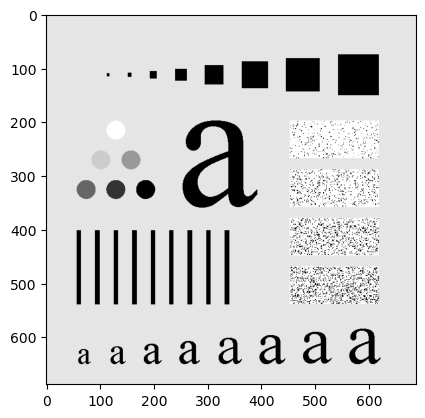

In [225]:
img = cv2.imread('imagens/Fig0445(a)(characters_test_pattern).tif', cv2.IMREAD_GRAYSCALE)
plt.imshow(img, cmap='gray')


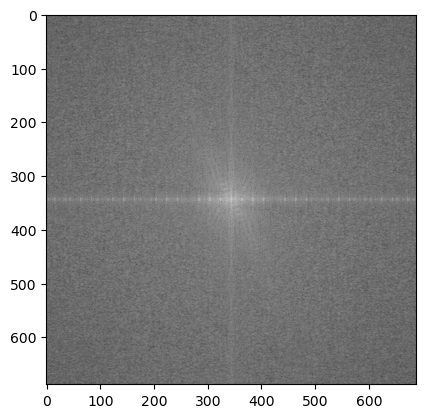

In [226]:
Fshift=dft(img)
plt.imshow(np.log1p(np.abs(Fshift)), cmap='gray')


Na imagem acima, temos a imagem no dominio da frequência com a sua Dft centralizada.

Assim sendo, agora será definido o filtro passa baixo, que é basicamente um circulo branco num fundo preto

In [227]:
def passaBaixa(img, fcorte):
    M,N = img.shape
    aux = np.zeros((M,N), dtype=np.float32)
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
            if D <= fcorte:
                aux[u,v] = 1
            else:
                aux[u,v] = 0
    return aux
   

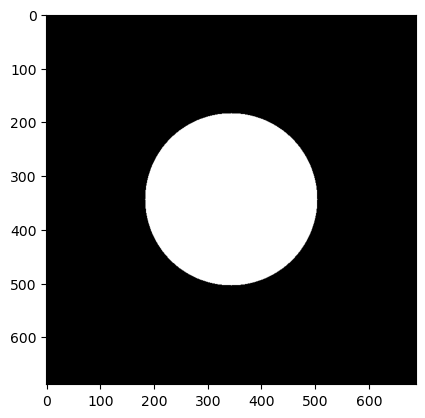

In [228]:
passaBaixaFiltro=passaBaixa(img, 160)
plt.imshow(passaBaixaFiltro, cmap='gray')

Com o filtro passa baixo é feita a convolução da imagem no domínio da frequencia, oque na frequencia, dado as propriedades, representa uma simples multiplicação.

In [229]:
def convolução(imgShift, filtro):
    Gshift=imgShift*filtro
    return Gshift



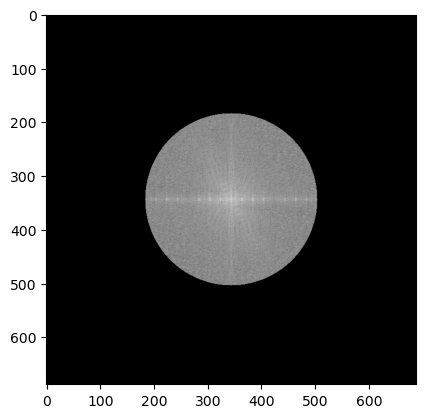

In [230]:
imgFiltrada=convolução(Fshift, passaBaixaFiltro)
plt.imshow(np.log1p(np.abs(imgFiltrada)), cmap='gray')

Após a convulução, a imagem é transformada para o domínio do tempo já filtrada:

In [231]:
def transformadaInversa(imgFiltradaShift):
    G=np.fft.ifftshift(imgFiltradaShift)
    g=np.abs(np.fft.ifft2(G))
    return g

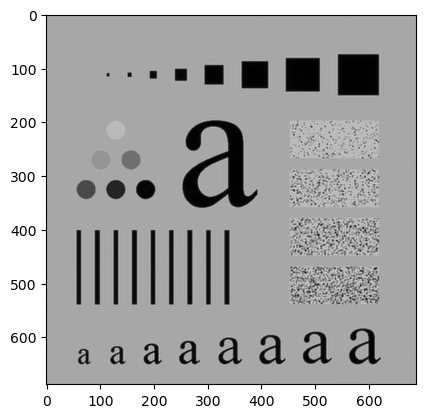

In [232]:
g=transformadaInversa(imgFiltrada)
plt.imshow(g, cmap='gray')


O processo narrado acima acontece para todos os filtros, basicamente a imagem é transformada para o domínio da frequência, posteriormente é realizado a convolução da mesma com o filtro desejado, sendo que após é realizada a transformada inversa da imagem filtrada;

Passa baixa:


In [233]:
passaBaixaFiltro1=passaBaixa(img, 10)
passaBaixaFiltro2=passaBaixa(img, 30)
passaBaixaFiltro3=passaBaixa(img, 60)
passaBaixaFiltro4=passaBaixa(img, 160)
passaBaixaFiltro5=passaBaixa(img, 460)
imgFiltrada1=convolução(Fshift, passaBaixaFiltro1)
imgFiltrada2=convolução(Fshift, passaBaixaFiltro2)
imgFiltrada3=convolução(Fshift, passaBaixaFiltro3)
imgFiltrada4=convolução(Fshift, passaBaixaFiltro4)
imgFiltrada5=convolução(Fshift, passaBaixaFiltro5)
pb1=transformadaInversa(imgFiltrada1)
pb2=transformadaInversa(imgFiltrada2)
pb3=transformadaInversa(imgFiltrada3)
pb4=transformadaInversa(imgFiltrada4)
pb5=transformadaInversa(imgFiltrada5)





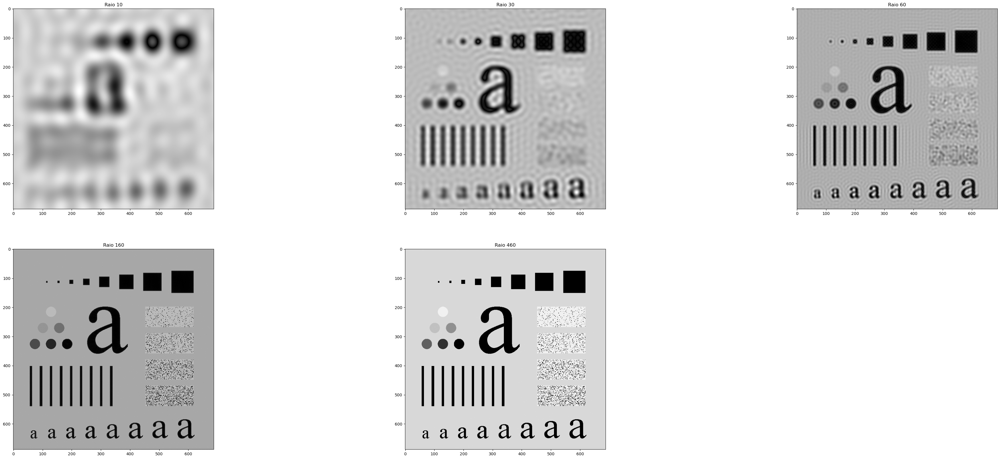

In [234]:
fig = plt.figure(figsize=(50,20))
plt.subplot(2, 3, 1)
plt.title('Raio 10')
plt.imshow(pb1,cmap = 'gray')
plt.subplot(2, 3, 2)
plt.title('Raio 30')
plt.imshow(pb2,cmap = 'gray')
plt.subplot(2, 3, 3)
plt.title('Raio 60')
plt.imshow(pb3,cmap = 'gray')
plt.subplot(2, 3, 4)
plt.title('Raio 160')
plt.imshow(pb4,cmap = 'gray')
plt.subplot(2, 3, 5)
plt.title('Raio 460')
plt.imshow(pb5,cmap = 'gray')



Passa baixa Butterworth:

In [235]:
def passaBaixaButterworth(img, fCorte, ordem):
    M,N = img.shape
    H = np.zeros((M,N), dtype=np.float32)
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
            H[u,v] = 1 / (1 + (D/fCorte)**(2*ordem))      
    return H

In [236]:
passaBaixaBFiltro1=passaBaixaButterworth(img, 10,2)
passaBaixaBFiltro2=passaBaixaButterworth(img, 30,2)
passaBaixaBFiltro3=passaBaixaButterworth(img, 60,2)
passaBaixaBFiltro4=passaBaixaButterworth(img, 160,2)
passaBaixaBFiltro5=passaBaixaButterworth(img, 460,2)
imgFiltrada1=convolução(Fshift, passaBaixaBFiltro1)
imgFiltrada2=convolução(Fshift, passaBaixaBFiltro2)
imgFiltrada3=convolução(Fshift, passaBaixaBFiltro3)
imgFiltrada4=convolução(Fshift, passaBaixaBFiltro4)
imgFiltrada5=convolução(Fshift, passaBaixaBFiltro5)
pbb1=transformadaInversa(imgFiltrada1)
pbb2=transformadaInversa(imgFiltrada2)
pbb3=transformadaInversa(imgFiltrada3)
pbb4=transformadaInversa(imgFiltrada4)
pbb5=transformadaInversa(imgFiltrada5)

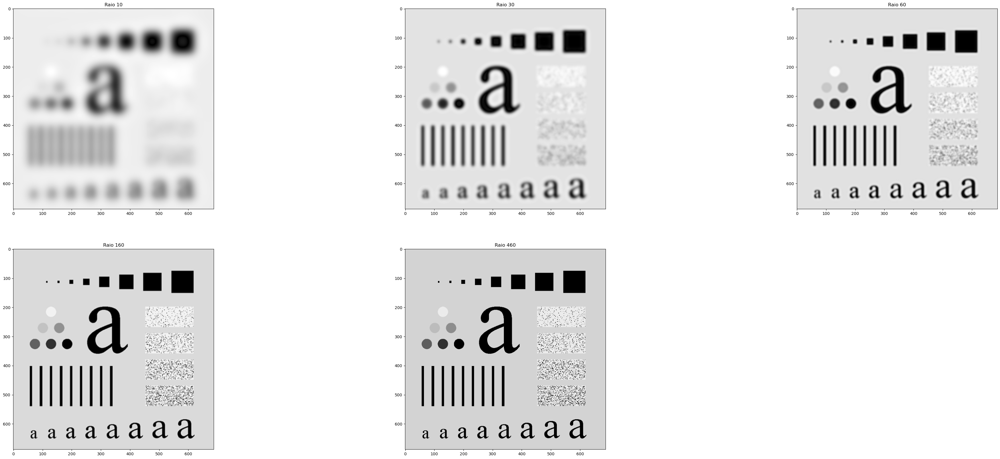

In [237]:
fig = plt.figure(figsize=(50,20))
plt.subplot(2, 3, 1)
plt.title('Raio 10')
plt.imshow(pbb1,cmap = 'gray')
plt.subplot(2, 3, 2)
plt.title('Raio 30')
plt.imshow(pbb2,cmap = 'gray')
plt.subplot(2, 3, 3)
plt.title('Raio 60')
plt.imshow(pbb3,cmap = 'gray')
plt.subplot(2, 3, 4)
plt.title('Raio 160')
plt.imshow(pbb4,cmap = 'gray')
plt.subplot(2, 3, 5)
plt.title('Raio 460')
plt.imshow(pbb5,cmap = 'gray')


Passa Baixa Guassiano:

In [238]:
def passaBaixaGaussiano(img, fcorte):
    M,N = img.shape
    aux = np.zeros((M,N), dtype=np.float32)
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
            aux[u,v] = np.exp(-D**2/(2*fcorte**2))
    return aux
            

In [239]:
passaBaixaGFiltro1=passaBaixaGaussiano(img, 10)
passaBaixaGFiltro2=passaBaixaGaussiano(img, 30)
passaBaixaGFiltro3=passaBaixaGaussiano(img, 60)
passaBaixaGFiltro4=passaBaixaGaussiano(img, 160)
passaBaixaGFiltro5=passaBaixaGaussiano(img, 460)
imgFiltrada1=convolução(Fshift, passaBaixaGFiltro1)
imgFiltrada2=convolução(Fshift, passaBaixaGFiltro2)
imgFiltrada3=convolução(Fshift, passaBaixaGFiltro3)
imgFiltrada4=convolução(Fshift, passaBaixaGFiltro4)
imgFiltrada5=convolução(Fshift, passaBaixaGFiltro5)
pbg1=transformadaInversa(imgFiltrada1)
pbg2=transformadaInversa(imgFiltrada2)
pbg3=transformadaInversa(imgFiltrada3)
pbg4=transformadaInversa(imgFiltrada4)
pbg5=transformadaInversa(imgFiltrada5)

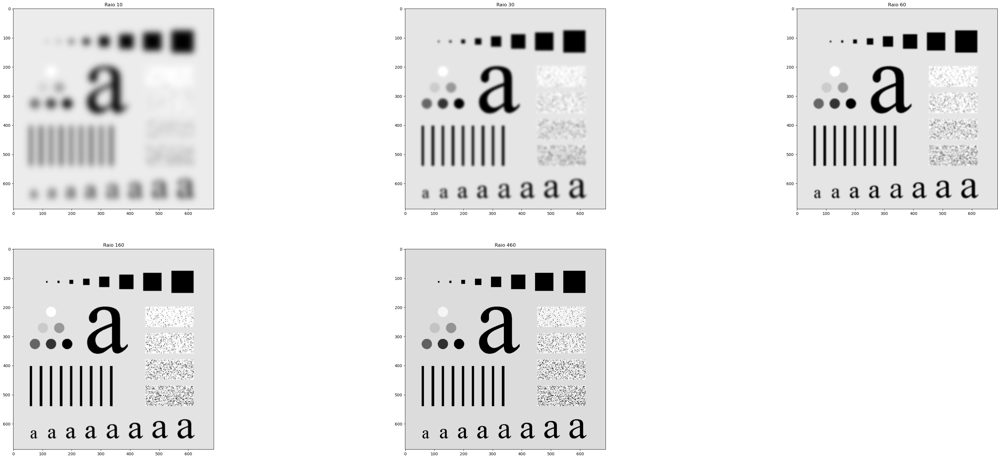

In [240]:
fig = plt.figure(figsize=(50,20))
plt.subplot(2, 3, 1)
plt.title('Raio 10')
plt.imshow(pbg1,cmap = 'gray')
plt.subplot(2, 3, 2)
plt.title('Raio 30')
plt.imshow(pbg2,cmap = 'gray')
plt.subplot(2, 3, 3)
plt.title('Raio 60')
plt.imshow(pbg3,cmap = 'gray')
plt.subplot(2, 3, 4)
plt.title('Raio 160')
plt.imshow(pbg4,cmap = 'gray')
plt.subplot(2, 3, 5)
plt.title('Raio 460')
plt.imshow(pbg5,cmap = 'gray')

Acima foi implementado o passa baixo ideal,   passa Baixa Butterworth e o gassiano, obtendo resultados próximos ao do livro/esperado.

Com esse tipo filtro(passa baixa) elimina-se as altas frequências na imagem, acima da frequência de corte, suavizando a mesma e eliminado ruídos.


O filtro passa-baixa ideal introduz uma mudança brusca na amplitude do sinal, uma vez que acima da frequência de corte a amplitude é definida como zero, enquanto abaixo é definida como um. Isso resulta em uma transição nítida na imagem, formando uma borda acentuada, mas também desencadeando o fenômeno conhecido como efeito de Gibbs ou ringing. Em imagens com uma frequência de corte mais baixa, 10 e 30 principalmente no nosso exemplo, podem surgir distorções, como ruídos, círculos ou oscilações, manifestadas por pequenos picos e vales que emergem antes das bordas. 


No entanto, ao avaliar imagens com diferentes frequências para os filtros gaussiano e butterworth, não se observam essas oscilações. Isso ocorre devido à transição mais gradual após a frequência de corte, que não é abrupta como no caso ideal. Consequentemente, em ambos os cenários, o problema observado no filtro ideal é resolvido, uma vez que a suavidade na transição elimina as distorções indesejadas.


Ao comparar os resultados entre os filtros gaussiano e butterworth, observa-se uma notável semelhança nos resultados, com as filtragens sendo altamente comparáveis em ambos os casos. No entanto, no segundo caso, a impressão é de que o filtro butterworth apresenta uma transição mais acentuada. Isso é devido à natureza das equações e aos gráficos resultantes, já que a exponencial exibe um comportamento mais linear/suave, enquanto o butterworth se assemelha mais a um degrau, aproximando-se, assim, do filtro ideal.

A comparação acima usou a tabela 4.4 e gráficos do Gonzales.

Passa alta:

In [241]:
def passaAlta(img, fcorte):
    M,N = img.shape
    aux = np.zeros((M,N), dtype=np.float32)
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
            if D >= fcorte:
                aux[u,v] = 1
            else:
                aux[u,v] = 0
    return aux

In [242]:
passaAltaFiltro1=passaAlta(img, 10)
passaAltaFiltro2=passaAlta(img, 30)
passaAltaFiltro3=passaAlta(img, 60)
passaAltaFiltro4=passaAlta(img, 160)
passaAltaFiltro5=passaAlta(img, 460)
imgFiltrada1=convolução(Fshift, passaAltaFiltro1)
imgFiltrada2=convolução(Fshift, passaAltaFiltro2)
imgFiltrada3=convolução(Fshift, passaAltaFiltro3)
imgFiltrada4=convolução(Fshift, passaAltaFiltro4)
imgFiltrada5=convolução(Fshift, passaAltaFiltro5)
pa1=transformadaInversa(imgFiltrada1)
pa2=transformadaInversa(imgFiltrada2)
pa3=transformadaInversa(imgFiltrada3)
pa4=transformadaInversa(imgFiltrada4)
pa5=transformadaInversa(imgFiltrada5)


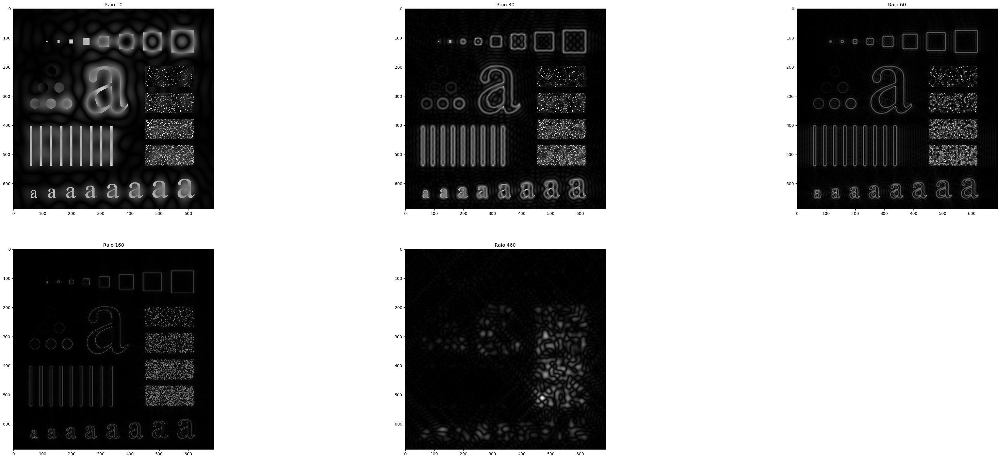

In [243]:
fig = plt.figure(figsize=(50,20))
plt.subplot(2, 3, 1)
plt.title('Raio 10')
plt.imshow(pa1,cmap = 'gray')
plt.subplot(2, 3, 2)
plt.title('Raio 30')
plt.imshow(pa2,cmap = 'gray')
plt.subplot(2, 3, 3)
plt.title('Raio 60')
plt.imshow(pa3,cmap = 'gray')
plt.subplot(2, 3, 4)
plt.title('Raio 160')
plt.imshow(pa4,cmap = 'gray')
plt.subplot(2, 3, 5)
plt.title('Raio 460')
plt.imshow(pa5,cmap = 'gray')

O filtro passa alta consiste em suprimir as frequências mais baixas, permitindo a passagem somente das que são mais elevadas que a frequência de corte. Isso equivale a considerar os valores situados além do raio D no círculo, com uma intensidade de 1, enquanto os valores contidos dentro desse raio têm uma intensidade de 0.

Na ilustração acima, foram aplicados filtros em imagens com diferentes frequências de corte. Quanto menor a frequência de corte, mais frequências são permitidas a passar, enquanto quanto maior a frequência de corte, apenas as frequências mais altas são permitidas, o que pode dificultar a identificação das bordas na imagem.

No exemplo acima, a faixa de frequência ideal para o filtro está entre 30 e 60, o que permite uma identificação mais precisa das bordas na imagem. Quando a frequência de corte é definida em 10, as bordas se tornam mais grossas e menos nítidas. Por outro lado, ao escolher as frequências de corte 160 e 460, não é possível discernir com clareza os detalhes da imagem, uma vez que apenas as frequências mais altas estão sendo transmitidas. 

Notch:

In [244]:
img2 = cv2.imread('imagens/Fig0464(a)(car_75DPI_Moire).tif', cv2.IMREAD_GRAYSCALE)


In [245]:
def createRejectNotch(img, notchFrequencies, notchBandwidth):
    M, N = img.shape
    rejectNotchFilter = np.ones((M, N), np.float32)
    
    for notchFrequencia in notch_frequencies: #percore as frequencias delimitadas
        passNotchFilter = passaAltoDeslocado(img, notchFrequencia, notchBandwidth) #criar o filtro naquela frequencia, por meio de recursao
        rejectNotchFilter*= passNotchFilter
    
    return rejectNotchFilter

In [246]:
def passaAltoDeslocado(img, notchFrequencia, bandwidth):
    M, N = img.shape
    passaAltoDeslocado = np.ones((M, N) , np.float32)
    
    for i in range(M):
        for j in range(N):
            D = np.sqrt((i - M/2) ** 2 + (j - N/2) ** 2) #função para criação do raio/circulo
            if np.abs(D - notchFrequencia) <= bandwidth / 2:  #delimitação da faixa onde o mesmo é 0, ou seja onde não passa frequencia.
                passaAltoDeslocado[i, j] = 0
    
    return passaAltoDeslocado

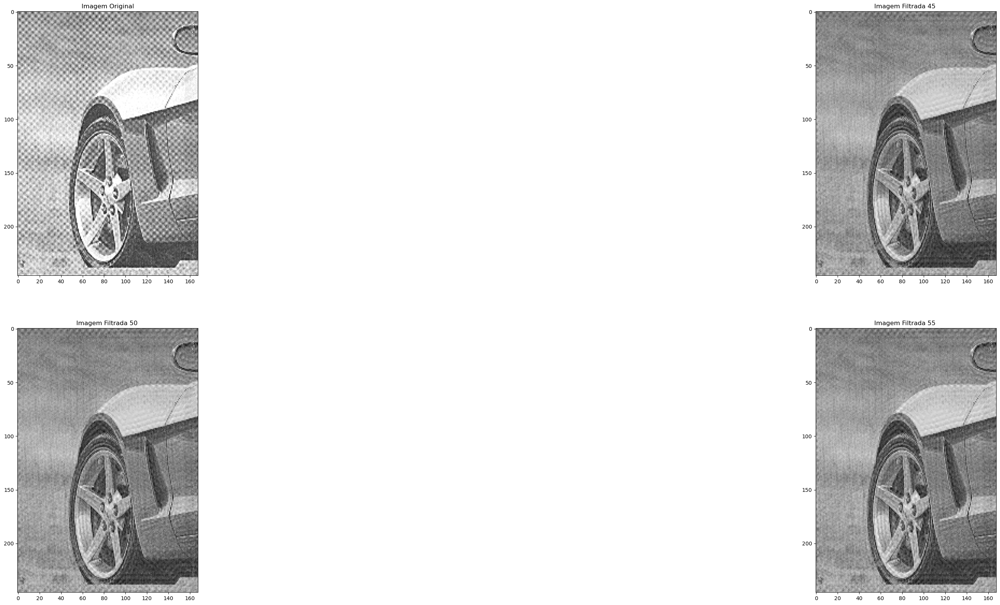

In [247]:
FshifNf=dft(img2)
notchf1 = [45, 90]
notchf2 = [50, 100]
notchf3 = [55, 110]
notchb = 10

# Criar o filtro rejeita-notch
RN1 = createRejectNotch(img2, notchf1, notchb)
RN2 = createRejectNotch(img2, notchf2, notchb)
RN3 = createRejectNotch(img2, notchf3, notchb)


imgFiltradaNfshift1=convolução(FshifNf,RN1)
imgFiltradaNfshift2=convolução(FshifNf,RN2)
imgFiltradaNfshift3=convolução(FshifNf,RN3)

imgFiltradaNf1=transformadaInversa(imgFiltradaNfshift1)
imgFiltradaNf2=transformadaInversa(imgFiltradaNfshift2)
imgFiltradaNf3=transformadaInversa(imgFiltradaNfshift3)


# Mostrar a imagem original e a imagem filtrada
fig = plt.figure(figsize=(50,20))
plt.subplot(2, 2, 1), 
plt.imshow(img2, cmap='gray')
plt.title('Imagem Original')
plt.subplot(2, 2, 2), 
plt.imshow(imgFiltradaNf1, cmap='gray')
plt.title('Imagem Filtrada 45 ')
plt.subplot(2, 2, 3)
plt.title('Imagem Filtrada 50 ')
plt.imshow(imgFiltradaNf2, cmap='gray')
plt.subplot(2, 2, 4)
plt.title('Imagem Filtrada 55 ')
plt.imshow(imgFiltradaNf3, cmap='gray')



Por tentativa e erro foi determinado que a mellhor frequencia para o filtro de notch era por volta de 50, como visto na imagem acima.

Percebe-se a importancia de se escolher exatamente a frequencia do maximo deslocado a fim do filtro anular o mesmo, não permitindo a passagem daquela frequencia em questão.

O filtro mencionado atua de forma similar a um filtro passa-alta deslocado, apresentando uma detecção semelhante àquela observada no filtro passa-alta, inclusive gerando uma representação circular. A operação desses dois tipos de filtro é comparável. Por outro lado, um filtro notch é projetado para bloquear frequências específicas, demandando, conforme mencionado, a superposição dos ruídos com o filtro correspondente para alcançar os resultados desejados. Isso foi evidenciado no caso em que uma frequência de 50 estava presente, ilustrando a necessidade dessa abordagem para atingir a meta estipulada



Rejeita banda

In [248]:
def rejeitaBanda(img):
    M,N = img.shape
    max=np.max(img)
    aux = np.zeros((M,N), dtype=np.float32)
    raio1=180
    raio2=185
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
            if D <= raio2 and D>= raio1:
                aux[u,v] = 0
            else:
                aux[u,v] = 1          
    return aux

    

In [249]:
def rejeitaBanda2(img, fcorte, w):
    M,N = img.shape
    max=np.max(img)
    aux = np.zeros((M,N), dtype=np.float32)
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
            if fcorte+w/2>=D:
                aux[u,v]=0
            elif  fcorte-w/2<=D:
                aux[u,v]=0
            else: 
                aux[u,v]=1
    return aux

In [250]:
img3 = cv2.imread('imagens/Fig0516(a)(applo17_boulder_noisy).tif', cv2.IMREAD_GRAYSCALE)
Fshift2=dft(img3)
rb= rejeitaBanda(img3)
rb2= rejeitaBanda2(img3, 160, 100)
imgFiltradaRB1=convolução(Fshift2,rb)
rejeitaB=transformadaInversa(imgFiltradaRB1)



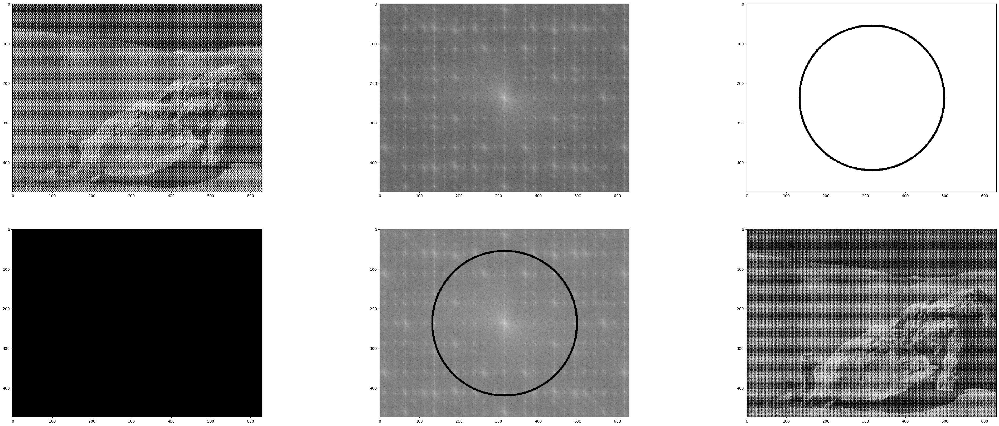

In [251]:
fig = plt.figure(figsize=(50,20))
plt.subplot(2, 3, 1)
plt.imshow(img3, cmap='gray')
plt.subplot(2, 3, 2)
plt.imshow(np.log1p(np.abs(Fshift2)), cmap='gray')
plt.subplot(2, 3, 3)
plt.imshow(rb, cmap='gray')
plt.subplot(2, 3, 4)
plt.imshow(rb2, cmap='gray')
plt.subplot(2, 3, 5)
plt.imshow(np.log1p(np.abs(imgFiltradaRB1)), cmap='gray')
plt.subplot(2, 3, 6)
plt.imshow(rejeitaB, cmap='gray')

Não consegui implementar de acordo a expressão forncecida do livro, mas buscando outras formas percebi que poderia ser feito da forma demonstrado acima, basicamente combinando um filtro de passa alta e outro de passa baixa.

No entanto, não consegui reproduzir os resultados delineados no livro. Isso se deve ao fato de que a imagem apresenta mais picos ou ruídos do que os exibidos no domínio da frequência. Não estou certo se isso é um equívoco na biblioteca "cv2" ou uma limitação do material em si. De qualquer forma, é perceptível uma notável pequena melhoria na nitideza da imagem fornecida com o filtro acima.

Para melhorar os resultados, na minha visão seria aumentar a largura do filtro permitindo menos a passagem das frequencias indesejadas.